# Data Science Capstone Project

## Accident Severity based on conditions

### Introduction

Transportation is a major part of the economy and our everyday lives.   From shipping to baseball games to driving to work, everybody uses transportation.  One of the major pitfalls of transportation is accidents and their severity.  Due to the nature of vehicle accidents, they can be very perilous.  Because this is such a major part of our lives, we should make every effort to prevent accidents through any means necessary to lessen or eliminate these accidents and their severity.

In this project, we will provide information to the traffic engineers to identify areas of local hotspots in Seattle to evaluate if they need speed adjustments based on conditions.  These speed adjustments will be based upon weather, light, and road conditions.  We will use clustering to determine these hotspots and identify an algorithm that will determine severity of accidents based on these conditions so they will be able to adjust the speed limit accordingly.

To identify these locations, we will use density based clustering (DBSCAN) to identify hotspots in Seattle. DBSCAN groups points that are closely packed together and marks points outside of these groups as noise. Therefore, using this algorithm, locations in which a high density of accidents take place will be highlighted as clusters. We can then plot the location of these clusters using folium.  


In [1]:
!pip install geopy

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [62]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import metrics
from sklearn.cluster import DBSCAN as dbscan

from sklearn.metrics import jaccard_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss

In [4]:
import folium
from geopy.distance import great_circle
from sklearn.cluster import DBSCAN as dbscan
import math
from mpl_toolkits.mplot3d import Axes3D

### Load data

The data we are using is based on police reports from Seattle, Washington. As such, lesser accidents that did not require police assistance are not included in the data.  The feature we are going to measure from the data set is the severity of the accidents which is represented in "SeverityCode" which has a value of 1 or 2.   The Features we are going to use for causation are Speeding, Weather conditions, Road conditions, Light conditions, Driver inattention, and Underinflated tires.


In [5]:
data = pd.read_csv('Data-Collisions.csv')
data.head()

C:\Users\brian\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [6]:
df = data
df.shape

(194673, 38)

#### Convert to date time object

In [7]:
df.columns

Index(['SEVERITYCODE', 'X', 'Y', 'OBJECTID', 'INCKEY', 'COLDETKEY', 'REPORTNO',
       'STATUS', 'ADDRTYPE', 'INTKEY', 'LOCATION', 'EXCEPTRSNCODE',
       'EXCEPTRSNDESC', 'SEVERITYCODE.1', 'SEVERITYDESC', 'COLLISIONTYPE',
       'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'INCDATE',
       'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLCODE', 'SDOT_COLDESC',
       'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND',
       'PEDROWNOTGRNT', 'SDOTCOLNUM', 'SPEEDING', 'ST_COLCODE', 'ST_COLDESC',
       'SEGLANEKEY', 'CROSSWALKKEY', 'HITPARKEDCAR'],
      dtype='object')

In [8]:
df['INCDATE'] = pd.to_datetime(df['INCDATE'])
df.head()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


#### Data visualtization and pre-processing

First, we will show the causation of accidents per severity for each Feature.  

In [9]:
# This is the variable we are measuring.
df['SEVERITYCODE'].value_counts()

1    136485
2     58188
Name: SEVERITYCODE, dtype: int64

In [10]:
# notice: installing seaborn might take a few minutes
!conda install -c anaconda seaborn -y

Solving environment: ...working... done

# All requested packages already installed.



#### Causation of accidents

As you can see from the charts below, most accidents happen when the weather is clear, during the day, and road conditions are dry.  While this seems counter-intuitive, it shows that the weather (which is out of our control) will not have the most impact on reducing accidents and their severity.  This gives us hope that adjusting what we can control (speed limits, routing, lights, etc) can possibly have a significant impact.

[Text(0, 0, 'Overcast'),
 Text(0, 0, 'Raining'),
 Text(0, 0, 'Clear'),
 Text(0, 0, 'Unknown'),
 Text(0, 0, 'Other'),
 Text(0, 0, 'Snowing'),
 Text(0, 0, 'Fog/Smog/Smoke'),
 Text(0, 0, 'Sleet/Hail/Freezing Rain'),
 Text(0, 0, 'Blowing Sand/Dirt'),
 Text(0, 0, 'Severe Crosswind'),
 Text(0, 0, 'Partly Cloudy')]

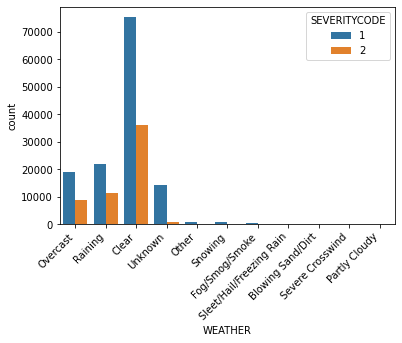

In [11]:
import seaborn as sns

ax = sns.countplot(x='WEATHER', hue='SEVERITYCODE', data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')


[Text(0, 0, 'Daylight'),
 Text(0, 0, 'Dark - Street Lights On'),
 Text(0, 0, 'Dark - No Street Lights'),
 Text(0, 0, 'Unknown'),
 Text(0, 0, 'Dusk'),
 Text(0, 0, 'Dawn'),
 Text(0, 0, 'Dark - Street Lights Off'),
 Text(0, 0, 'Other'),
 Text(0, 0, 'Dark - Unknown Lighting')]

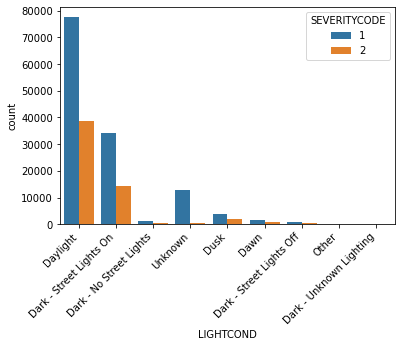

In [12]:
ax = sns.countplot(x='LIGHTCOND', hue='SEVERITYCODE', data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

[Text(0, 0, 'Wet'),
 Text(0, 0, 'Dry'),
 Text(0, 0, 'Unknown'),
 Text(0, 0, 'Snow/Slush'),
 Text(0, 0, 'Ice'),
 Text(0, 0, 'Other'),
 Text(0, 0, 'Sand/Mud/Dirt'),
 Text(0, 0, 'Standing Water'),
 Text(0, 0, 'Oil')]

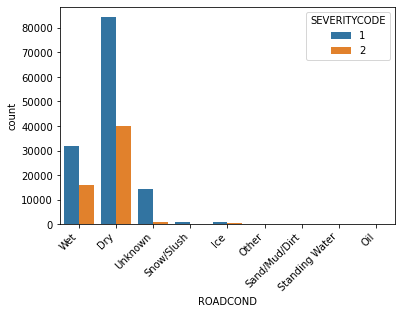

In [13]:
ax = sns.countplot(x='ROADCOND', hue='SEVERITYCODE', data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

[Text(0, 0, 'N'), Text(0, 0, 'Y')]

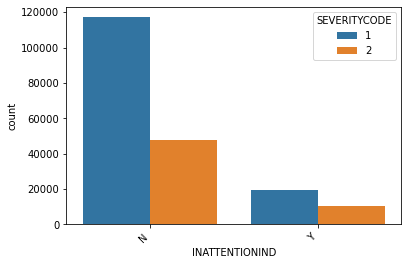

In [14]:
df.INATTENTIONIND.fillna('N', inplace = True)
ax = sns.countplot(x='INATTENTIONIND', hue='SEVERITYCODE', data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

[Text(0, 0, 'N'), Text(0, 0, 'Y')]

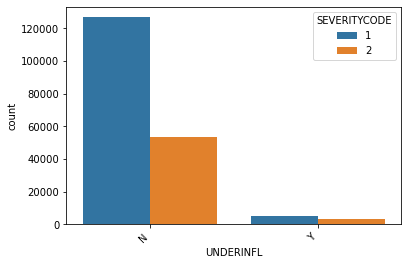

In [65]:
df.UNDERINFL.fillna('N', inplace = True)
df.UNDERINFL.replace({'0':'N', '1':'Y'}, inplace = True)
ax = sns.countplot(x='UNDERINFL', hue='SEVERITYCODE', data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

[Text(0, 0, 'Angles'),
 Text(0, 0, 'Sideswipe'),
 Text(0, 0, 'Parked Car'),
 Text(0, 0, 'Other'),
 Text(0, 0, 'Cycles'),
 Text(0, 0, 'Rear Ended'),
 Text(0, 0, 'Head On'),
 Text(0, 0, 'N'),
 Text(0, 0, 'Left Turn'),
 Text(0, 0, 'Pedestrian'),
 Text(0, 0, 'Right Turn')]

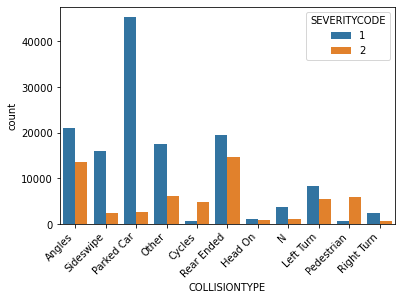

In [16]:
df.COLLISIONTYPE.fillna('N', inplace = True)
ax = sns.countplot(x='COLLISIONTYPE', hue='SEVERITYCODE', data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

### Observations of data visualization

Using the barcharts above, we can see that the individual Features did not have a significant impact on accidents. This shows that it is a combination of Features that contribute to accidents.  Traffic engineers will use these combinations to design roads and equipment to assist in the prevention of accidents.  


#### Clustering
To identify the location hotspots where accidents occur, we will use clustering on a map to show accident density.  To do this, we will use DBSCAN.

DBSCAN requires the ability to calculate the distance between points.   To do this, we shall create a function that takes the latitude and longitude of two points and calculates the distance between them in meters.  Geopy's "great_circle" function is used to ensure the curvature of the earth is included in these calculations.  While this may not be necessary in our current data set of Seattle, it would open the possibility for use in future projects with greater distances.

In [17]:
def greatcircle(x,y):
    lat1, long1 = x[0], x[1]
    lat2, long2 = y[0], y[1]
    dist = great_circle((lat1, long1), (lat2, long2)).meters
    return dist

Now we have the ability to find the clusters using DBSCAN. EPS is a variable that defines the distance between two points to be identified as in the same cluster. Min_samples allows for adjustament as well to determine the size and number of points contained in each cluster.  By adjusting the eps and min_samples, we can get a visual of hotspots for further study for of how to 

In [18]:
df.dropna(subset = ['X', 'Y'], inplace=True)
df.shape


(189339, 38)

In [19]:
df_dbc = df

In [20]:
eps = 75 # distance in meters
min_samples = 250


loc = df_dbc[['Y','X']]

dbc = dbscan(eps = eps, min_samples = min_samples, metric=greatcircle).fit(loc)

labels = dbc.labels_
unique_labels = np.unique(dbc.labels_)

print(unique_labels)

df_dbc['Cluster'] = labels


[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46]


In [21]:
location = df_dbc['Y'].mean(), df_dbc['X'].mean()

m = folium.Map(location=location,zoom_start=11)

folium.TileLayer('cartodbpositron').add_to(m)

clust_colours = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00',
                 '#cab2d6','#6a3d9a','#ffff99','#b15928']

for i in range(0,len(df_dbc)):
    colouridx = df_dbc['Cluster'].iloc[i]
    if colouridx == -1:
        pass
    else:
        col = clust_colours[colouridx%len(clust_colours)]
        folium.CircleMarker([df_dbc['Y'].iloc[i],df_dbc['X'].iloc[i]], radius = 10, color = col, fill = col).add_to(m)

m

As shown above, the majority of accidents occurred downtown in Seattle and this should be the focus of improving infrastructures.

### Accident Prevention through Prediction

Using machine learning, we can predict the conditions where accident severity is greater in an effort to try and lessen future occurrences.

#### Data processing

First we must process our data to make it usable in machine learning.  Then we must split it into training and testing datasets.

In [31]:
Features = df[['SPEEDING','INATTENTIONIND','UNDERINFL', 'WEATHER','LIGHTCOND','ROADCOND']]
Features.head()

,SPEEDING,INATTENTIONIND,UNDERINFL,WEATHER,LIGHTCOND,ROADCOND
0,NaN,N,N,Overcast,Daylight,Wet
1,NaN,N,0,Raining,Dark - Street Lights On,Wet
2,NaN,N,0,Overcast,Daylight,Dry
3,NaN,N,N,Clear,Daylight,Dry
4,NaN,N,0,Raining,Daylight,Wet


In [32]:
Features.fillna('N', inplace=True)
Features['SPEEDING'].replace({'N':'0','Y':'1'}, inplace = True)
Features['INATTENTIONIND'].replace({'N':'0','Y':'1'}, inplace = True)
Features['UNDERINFL'].replace({'N':'0','Y':'1'}, inplace = True)
Features = pd.concat([Features, pd.get_dummies(df['WEATHER'])], axis=1)
Features = pd.concat([Features, pd.get_dummies(df['LIGHTCOND'])], axis=1)
Features = pd.concat([Features, pd.get_dummies(df['ROADCOND'])], axis=1)
Features.drop(columns = ['WEATHER','LIGHTCOND','ROADCOND'], inplace=True)

Features.head()


C:\Users\brian\anaconda3\lib\site-packages\pandas\core\frame.py:4147: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(
C:\Users\brian\anaconda3\lib\site-packages\pandas\core\generic.py:6746: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


,SPEEDING,INATTENTIONIND,UNDERINFL,Blowing Sand/Dirt,Clear,Fog/Smog/Smoke,Other,Overcast,Partly Cloudy,Raining,...,Unknown,Dry,Ice,Oil,Other,Sand/Mud/Dirt,Snow/Slush,Standing Water,Unknown,Wet
0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1


In [33]:
Features.shape

(189339, 32)

In [34]:
X = Features
y = df['SEVERITYCODE']
y.shape

(189339,)

### Normalize Data

Data Standardization give data zero mean and unit variance (technically should be done after train test split )

In [35]:
X= preprocessing.StandardScaler().fit(X).transform(X)

In [36]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (151471, 32) (151471,)
Test set: (37868, 32) (37868,)


## Classifcation

Now, it is your turn, use the training set to build an accurate model. Then use the test set to report the accuracy of the model
You should use the following algorithm:
- K Nearest Neighbor(KNN)
- Decision Tree
- Support Vector Machine
- Logistic Regression

## K Nearest Neighbor(KNN)

In [37]:
from sklearn.neighbors import KNeighborsClassifier

k = 10

#Train Model and Predict  
KNNmodel = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
KNNmodel

KNeighborsClassifier(n_neighbors=10)

In [38]:
yhat_KNN = KNNmodel.predict(X_test)
yhat_KNN[0:5]

print("Train set Accuracy: ", metrics.accuracy_score(y_train, KNNmodel.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat_KNN))

Train set Accuracy:  0.6825530959721663
Test set Accuracy:  0.6762702017534594


In [39]:
Ks = 30
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];
for n in range(1,Ks):
    
    #Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train,y_train)
    yhat_KNN=neigh.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat_KNN)

    
    std_acc[n-1]=np.std(yhat_KNN==y_test)/np.sqrt(yhat_KNN.shape[0])

mean_acc

array([0.65472166, 0.68347945, 0.66475652, 0.69190345, 0.67286363,
       0.67632302, 0.61933559, 0.6225309 , 0.62047111, 0.6762702 ,
       0.66029365, 0.66216859, 0.66098025, 0.66203655, 0.66208936,
       0.66317207, 0.66264392, 0.69248442, 0.69126967, 0.69282772,
       0.69224675, 0.69229957, 0.69219394, 0.6924316 , 0.67690398,
       0.67735291, 0.67714165, 0.69293335, 0.69280131])

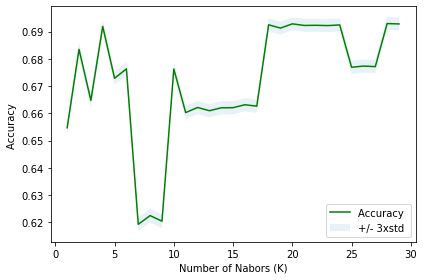

In [40]:
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Nabors (K)')
plt.tight_layout()
plt.show()

In [41]:
print( "The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1) 

The best accuracy was with 0.6929333474173445 with k= 28


In [42]:
k = mean_acc.argmax()+1

#Train Model and Predict  
KNNmodel = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
KNNmodel


KNeighborsClassifier(n_neighbors=28)

In [55]:
KNN_jaccard = jaccard_score(y_test, yhat_KNN)
KNN_F1 = f1_score(y_test, yhat_KNN, average='weighted') 

## Decision Tree

In [43]:
from sklearn.tree import DecisionTreeClassifier

decTree = DecisionTreeClassifier(criterion="entropy", max_depth = 4)
decTree

DecisionTreeClassifier(criterion='entropy', max_depth=4)

In [44]:
decTree.fit(X_train,y_train)
predTree = decTree.predict(X_test)
print("DecisionTrees's Accuracy: ", metrics.accuracy_score(y_test, predTree))

DecisionTrees's Accuracy:  0.6931974226259638


In [57]:
DecTree_jaccard = jaccard_score(y_test, predTree)
DecTree_F1 = f1_score(y_test, predTree, average='weighted') 

## Support Vector Machine


In [45]:
from sklearn import svm

clf = svm.SVC(kernel='rbf')
clf.fit(X_train, y_train) 
yhat_SVM = clf.predict(X_test)
yhat_SVM [0:20]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
      dtype=int64)

In [46]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools
%matplotlib inline

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    

              precision    recall  f1-score   support

           1       0.69      1.00      0.82     26251
           2       0.53      0.00      0.01     11617

    accuracy                           0.69     37868
   macro avg       0.61      0.50      0.41     37868
weighted avg       0.64      0.69      0.57     37868

Confusion matrix, without normalization
[[26224    27]
 [11587    30]]


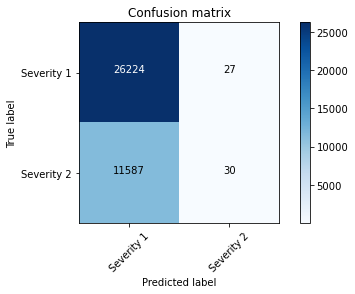

In [47]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, yhat_SVM)
np.set_printoptions(precision=2)

print (classification_report(y_test, yhat_SVM))

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Severity 1','Severity 2'],normalize= False,  title='Confusion matrix')

In [59]:
SVM_jaccard = jaccard_score(y_test, yhat_SVM)
SVM_F1 = f1_score(y_test, yhat_SVM, average='weighted') 

## Logistic Regression

In [48]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train,y_train)
LR

LogisticRegression(C=0.01, solver='liblinear')

In [49]:
yhat_LR = LR.predict(X_test)
yhat_LR

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [50]:
yhat_prob_LR = LR.predict_proba(X_test)
yhat_prob_LR

array([[0.79, 0.21],
       [0.97, 0.03],
       [0.67, 0.33],
       ...,
       [0.97, 0.03],
       [0.75, 0.25],
       [0.72, 0.28]])

In [51]:
LR_jaccard = jaccard_score(y_test, yhat_LR)

Confusion matrix, without normalization
[[26246     5]
 [11613     4]]


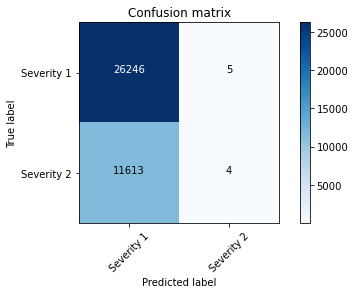

In [52]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, yhat_LR)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Severity 1','Severity 2'],normalize= False,  title='Confusion matrix')

In [63]:
LR_jaccard = jaccard_score(y_test, yhat_LR)
LR_F1 = f1_score(y_test, yhat_LR, average='weighted') 
LRLogLoss = log_loss(y_test, yhat_prob_LR)

In [64]:
df_score=[]
df_score = pd.DataFrame(df_score, columns = ['Algorithm', 'Jaccard', 'F1-score', 'LogLoss'])
df_score.Algorithm = ['KNN', 'Decision Tree', 'SVM', 'Logistic Regression']
df_score.Jaccard = [KNN_jaccard, DecTree_jaccard, SVM_jaccard, LR_jaccard]
df_score['F1-score'] = [KNN_F1, DecTree_F1, SVM_F1, LR_F1]

df_score.LogLoss = ['NA', 'NA', 'NA', LRLogLoss]

df_score


,Algorithm,Jaccard,F1-score,LogLoss
0,KNN,0.691571,0.574589,NA
1,Decision Tree,0.693197,0.567614,NA
2,SVM,0.693060,0.569124,NA
3,Logistic Regression,0.693165,0.567809,0.594918
